# Overview

This notebook implements the Detectron2 (https://github.com/facebookresearch/detectron2) library on the Bob Ross Paintings dataset to create semantic segmentation masks.

Detectron2 tutorial Colab: https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=h9tECBQCvMv3 

# Dataset overview

Dataset link: https://www.kaggle.com/residentmario/segmented-bob-ross-images

This dataset contains ~250 segmented Bob Ross paintings with 9 classes. Bob Ross was a painter and painting instructor who was on PBS public television for over a decade with his show "The Joy of Painting". Bob Ross is known for his easy-to-learn "wet-on-wet" painting style, the use of vibrant color in his landscape paintings, and for his generally calm, joyous personality.

## Sample images

![picture](https://i.imgur.com/A6T6y6o.png)

![picture](https://www.kaggleusercontent.com/kf/27849031/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..-EbR5fJxZN8giHn9yHKa7A.7kYk5NTpAiuRMj6O6_27rr3fQiczhrWsDJWVeNLtHva63fnEqqT2TzWdxAMn6j12G1K9nFGMBc68J0-f3klcOseFigFP1ZZD7-0i5_gTTuRnSSeADP7eMvxRKvwJuMhV97RONvlxv93gQYfaBsXHE1fGp9Prv02g_hc6t5HaTgUhlQHqK3AMcMiOx61KNK7PQZyNSBgkEUS_8x2ehEYgYvKZaPGVyzAk4DSa3Wh7y6NzQoZUmbxvCfmBhbjsu08DZTYcoSkPMljGuI6db3-XwHrNjhDG77MrlYCUS3KyWok-FQY_T0KNyn-QquXgvlIcBtoMVNnnHI06m2FZMmMDbLKhjrZFtsrCZn9vf7f7huI42zGqKm8Eq6K2jFZbV_tyoiUAW80IDZz0eXCjzvsnCm-9tfpK94O-8wr0rRJFiEL_PNzMFAounoFM49iP7i60aBpr9jedAZtc1h0KIo8Jj3UT-MK3bXWTPVU8rel4jNRkXV9KF01THuyI7Pq7CKepLsCzQytZ70H9RD7np7h2heKwCZwWNN9D9tBwuaUd5_QgZqf3mCnF8SgIGaTbXI-m2a4qQZMygmfOZqBLFsKsb9vECviElPCLUecXPGTjVO6rlkdnt-SlEcx_KJij-SUt4Y4EZMIa6dE9HmsH8jD_t8DVzfzAyK5QuXNFdvCYXyQS0Hu8o07cqFWMv_zEVqpsYt8Gzd8o282hzNyR3ZZvLw.QJU_4_qEfBdaGtc9ebPvNA/__results___files/__results___19_1.png)


In [ ]:
#!python3 -m pip install pyyaml==5.1
# # This is the current pytorch version on Colab. Uncomment this if Colab changes its pytorch version
#!python3 -m pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!python3 -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

In [1]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu102 True


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog

from detectron2.evaluation import SemSegEvaluator

# import PointRend project
from detectron2.projects import point_rend

# Train on a custom dataset

In this section, we will train an existing detectron2 model on a custom dataset which is not in the detectron2 format.

We'd love to see how you can improve the performance of the model. 

# Downloading the dataset
You will need to upload your kaggle API keys (kaggle.json file) to the Colab folder. 

Please make sure to select the GPU runtime under Runtime --> Change runtime type.

In [ ]:
! mkdir -p ~/.kaggle
! echo '{"username":"princep","key":"XXX"}' > kaggle.json 
! cp kaggle.json ~/.kaggle
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download residentmario/segmented-bob-ross-images
! unzip -n segmented-bob-ross-images

Register the Bob Ross Paintings dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we need to write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [5]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

In [6]:
from PIL import Image
from fvcore.common.file_io import PathManager

In [7]:
DATA_DIR = './'

images_dir = os.path.join(DATA_DIR, 'train', 'images')
masks_dir = os.path.join(DATA_DIR, 'train', 'labels')

image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]

paths_df = pd.DataFrame()
paths_df['image_path'] = image_paths
paths_df['mask_path'] = mask_paths

# Shuffle DataFrame
paths_df = paths_df.sample(frac=1).reset_index(drop=True)
print("Total Images = " + str(len(paths_df)))
# Perform 90/10 split for train / val
valid_df = paths_df.sample(frac=0.1, random_state=42)
train_df = paths_df.drop(valid_df.index)
len(train_df), len(valid_df)

Total Images = 250


(225, 25)

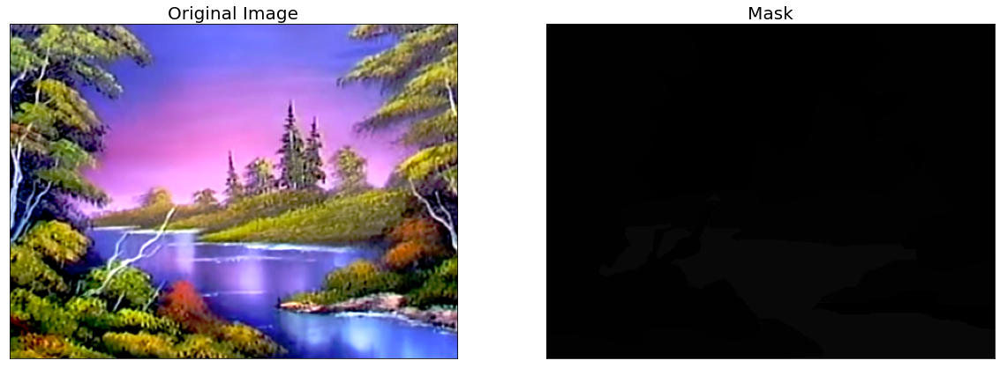

In [8]:
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()


image = cv2.cvtColor(cv2.imread(paths_df['image_path'][0]), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(paths_df['mask_path'][0]), cv2.COLOR_BGR2RGB)

visualize(
    original_image = image,
    mask = mask
)

In [9]:
from PIL import Image
import numpy as np

def convert_images(input_df):
    if(input_df == 'train'):
        image_paths = train_df['image_path'].tolist()
        mask_paths = train_df['mask_path'].tolist()
    else:
        image_paths = valid_df['image_path'].tolist()
        mask_paths = valid_df['mask_path'].tolist()

    counter = 0
    for image_file, gt_file in zip(image_paths, mask_paths):
        im = np.array(Image.open(gt_file))
        im[im == 3] = 0
        im[im == 5] = 1
        im[im == 10] = 2
        im[im == 14] = 3
        im[im == 17] = 4
        im[im == 18] = 5
        im[im == 22] = 6
        im[im == 27] = 7
        im[im == 61] = 8
        pil_img_gray = Image.fromarray(im)
        pil_img_gray.save(gt_file)
        
        

        

In [10]:
convert_images('train')

In [11]:
convert_images('valid')

In [12]:
labels_df = pd.read_csv("./labels.csv")
# Get class names
class_names = labels_df['class'].tolist()
# Get class IDs
class_ids = [ str(x) for x in labels_df['Id'].tolist() ] 
select_colors = [( 112, 150, 146), ( 190, 250, 190), (51, 51, 0), (119, 11, 32), (9, 143, 150), (102, 51, 0), (255, 22, 96), (190, 153, 153), (254, 228, 12)]

stuff_id = {}
counter = 0
for i in class_ids:
  stuff_id[int(i)] = counter
  counter = counter + 1

print('All dataset class names and their corresponding IDs in labels:')
print('Class Names: ', class_names)
print('Class IDs: ', class_ids)
print('Class IDs: ', len(class_ids))
print('Class Colors: ', len(select_colors))
print(stuff_id)

All dataset class names and their corresponding IDs in labels:
Class Names:  ['sky', 'tree', 'grass', 'earth;rock', 'mountain;mount', 'plant;flora;plant;life', 'water', 'sea', 'river']
Class IDs:  ['3', '5', '10', '14', '17', '18', '22', '27', '61']
Class IDs:  9
Class Colors:  9
{3: 0, 5: 1, 10: 2, 14: 3, 17: 4, 18: 5, 22: 6, 27: 7, 61: 8}


In [13]:
def load_painting(input_df):
    results = []
    if(input_df == 'train'):
        image_paths = train_df['image_path'].tolist()
        mask_paths = train_df['mask_path'].tolist()
    else:
        image_paths = valid_df['image_path'].tolist()
        mask_paths = valid_df['mask_path'].tolist()

    counter = 0
    for image_file, gt_file in zip(image_paths, mask_paths):

        # PIL Image is efficient as it doesn't read image to retrieve size
        im = Image.open(image_file)
        width, height = im.size
        record = {}
        record["file_name"] = image_file
        record["image_id"] = counter
        record["sem_seg_file_name"] = gt_file
        record["height"] = height
        record["width"] = width
        counter = counter + 1
        results.append(record)
        

    assert len(results),  f"No images found in {image_dir}!"
    assert PathManager.isfile(results[0]["sem_seg_file_name"]
    ), "Passed"  # noqa

    return results


In [14]:
############ Register Dataset########
from detectron2.data import DatasetCatalog, MetadataCatalog

stuff_colors = [k for k in select_colors]
stuff_classes = [k for k in class_names]

for d in ["train", "valid"]:
    DatasetCatalog.register("painting_" + d, lambda d=d: load_painting(str(d)))
    MetadataCatalog.get("painting_" + d).set(stuff_color=stuff_colors, 
                                             stuff_classes=class_ids, 
                                             evaluator_type=["sem_seg"],
                                             stuff_dataset_id_to_contiguous_id=stuff_id,
                                             ignore_label=[],
                                             )
    
painting_metadata = MetadataCatalog.get("painting_train")

In [22]:
DatasetCatalog.clear()
MetadataCatalog.clear()

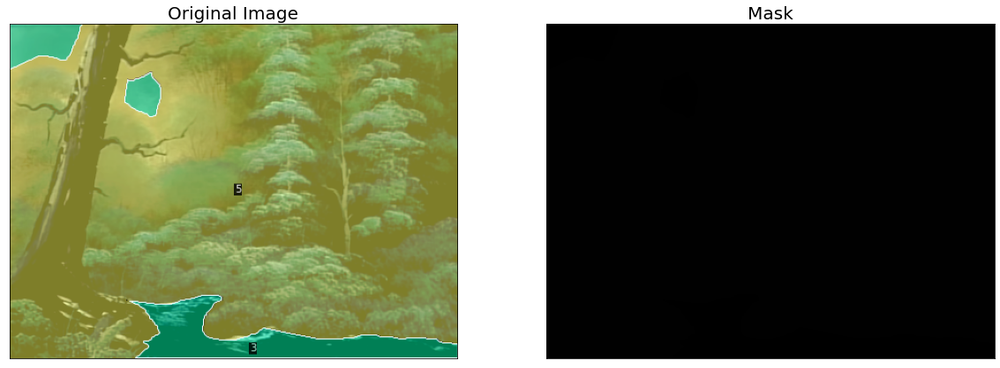

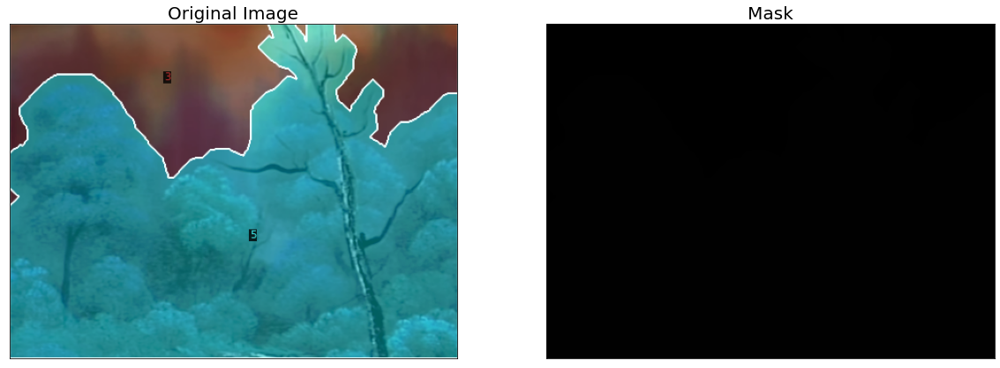

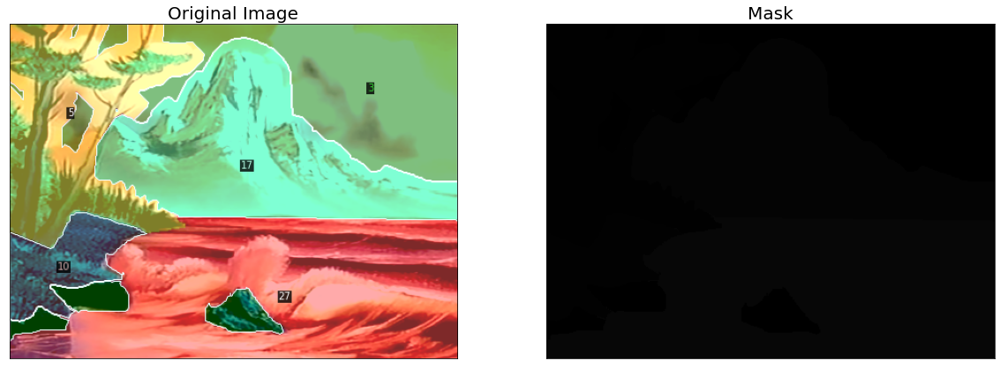

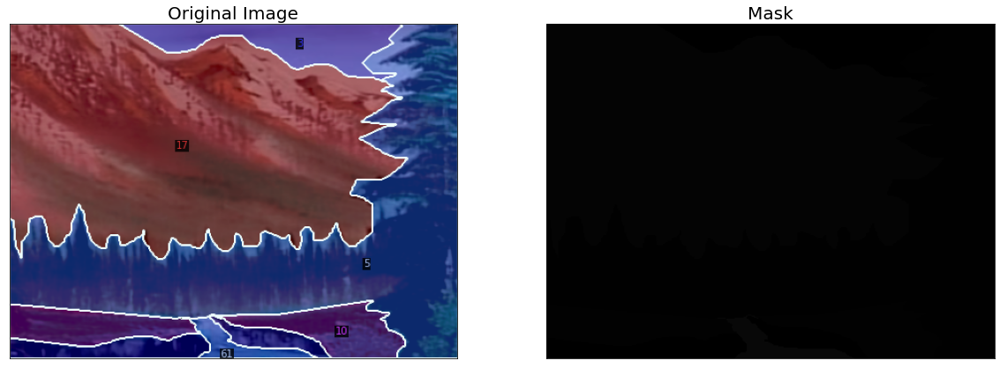

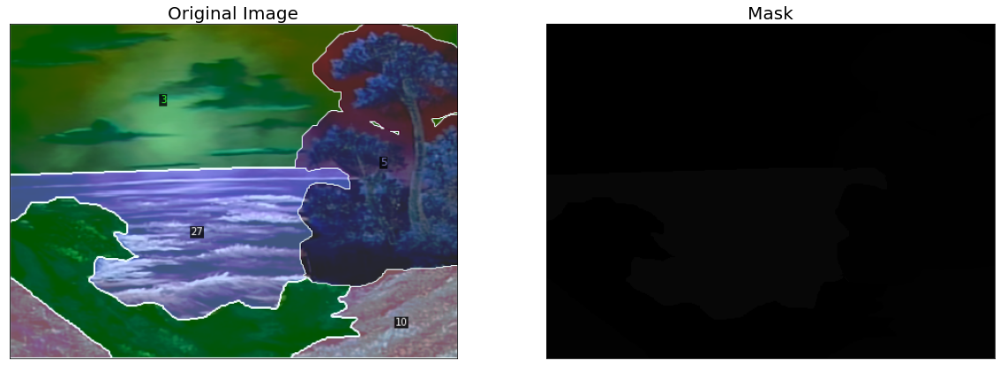

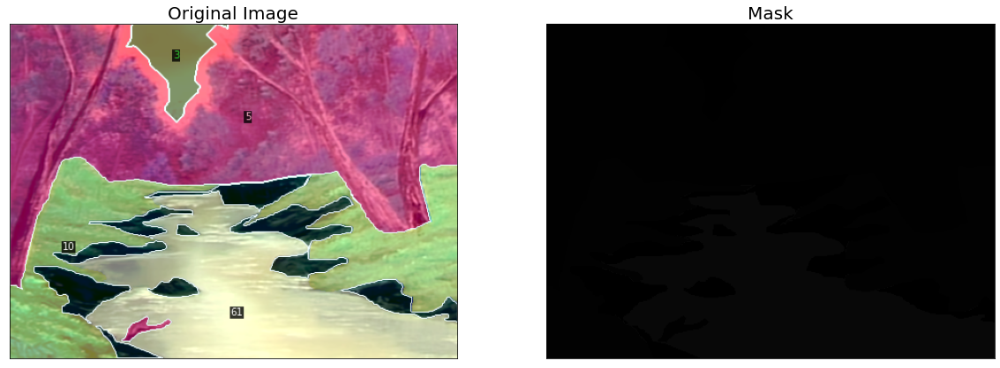

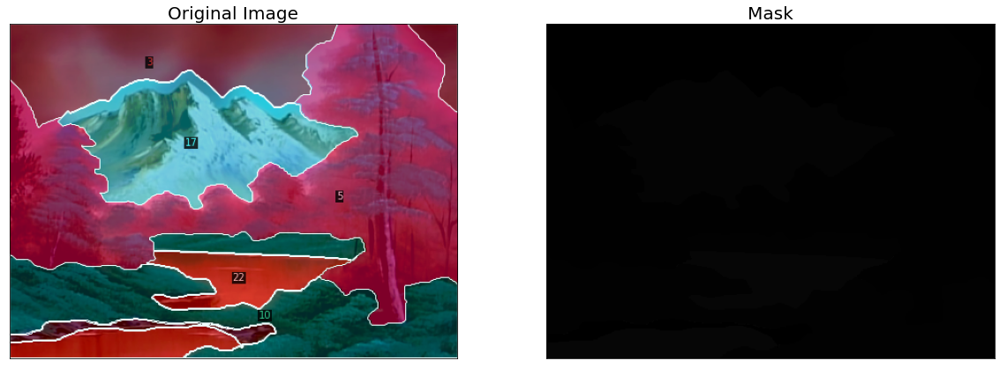

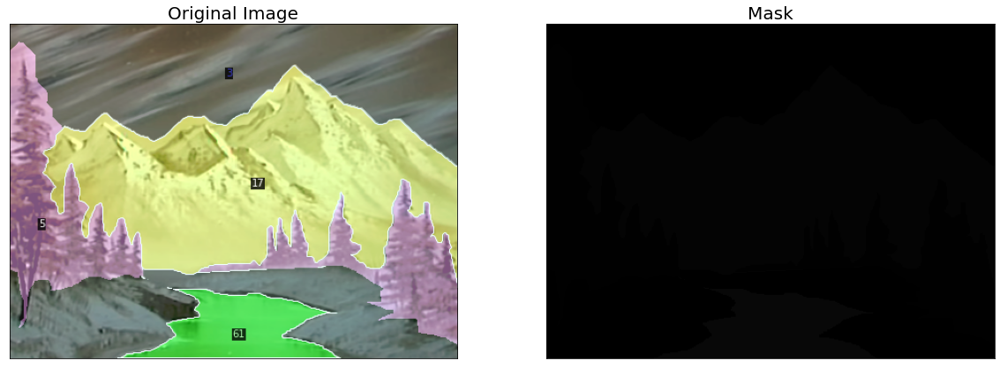

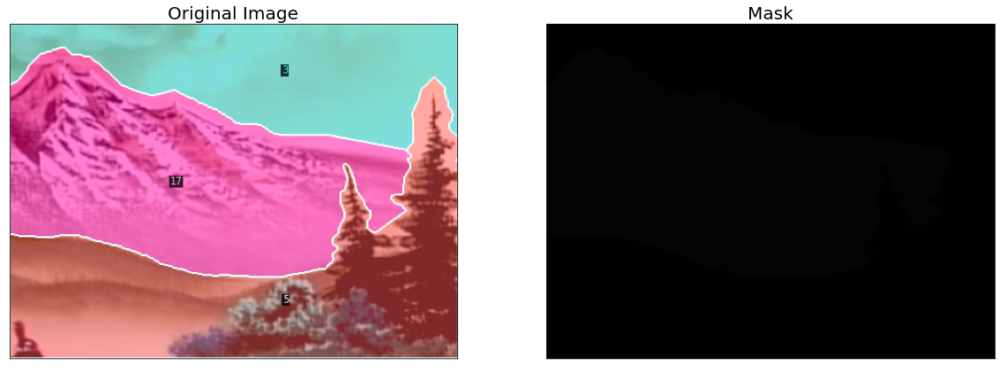

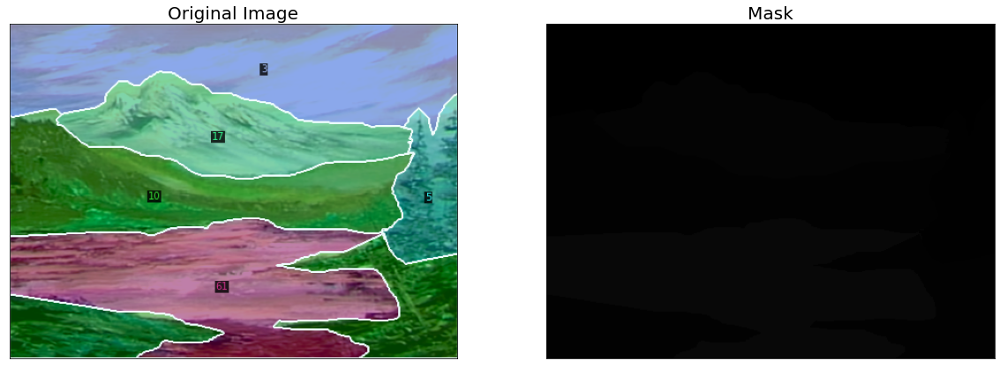

In [15]:
dataset_dicts = load_painting("train")
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    mask = cv2.imread(d["sem_seg_file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=painting_metadata, scale=1, instance_mode=ColorMode.SEGMENTATION )
    out = visualizer.draw_dataset_dict(d)
    
    visualize(
        original_image = out.get_image()[:, :, ::-1],
        mask = mask
    )

In [20]:
from detectron2.engine import DefaultTrainer, DefaultPredictor, launch
from detectron2.config import get_cfg

In [48]:
cfg = get_cfg()
# Add PointRend-specific config
point_rend.add_pointrend_config(cfg)
# Load a config from file
cfg.merge_from_file("detectron2/projects/PointRend/configs/SemanticSegmentation/pointrend_semantic_R_101_FPN_1x_cityscapes.yaml")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-101.pkl"
cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES = len(class_ids)
cfg.MODEL.POINT_HEAD.NUM_CLASSES = len(class_ids)

cfg.DATASETS.TRAIN = ("painting_train",)
cfg.DATASETS.TEST = ("painting_valid",)

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500 # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset

cfg.INPUT.MIN_SIZE_TRAIN = (512,)
cfg.INPUT.MIN_SIZE_TEST = (512,)
cfg.INPUT.MAX_SIZE_TRAIN = 512
cfg.INPUT.MAX_SIZE_TEST = 512
cfg.INPUT.CROP.ENABLED = False

cfg.DATALOADER.NUM_WORKERS = 5
cfg.OUTPUT_DIR="output"

In [43]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 


[10/10 10:02:28 d2.engine.defaults]: Model:
SemanticSegmentor(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (r

[10/10 10:02:28 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(512,), max_size=512, sample_style='choice'), RandomFlip()]
[10/10 10:02:28 d2.data.build]: Using training sampler TrainingSampler
[10/10 10:02:28 d2.data.common]: Serializing 225 elements to byte tensors and concatenating them all ...
[10/10 10:02:28 d2.data.common]: Serialized dataset takes 0.03 MiB
WARNING [10/10 10:02:28 d2.solver.build]: SOLVER.STEPS contains values larger than SOLVER.MAX_ITER. These values will be ignored.


In [44]:
trainer.resume_or_load(resume=False)
trainer.train()

[10/10 10:02:37 d2.checkpoint.c2_model_loading]: Renaming Caffe2 weights ......
[10/10 10:02:38 d2.checkpoint.c2_model_loading]: Following weights matched with submodule backbone.bottom_up:
| Names in Model    | Names in Checkpoint       | Shapes                                          |
|:------------------|:--------------------------|:------------------------------------------------|
| res2.0.conv1.*    | res2_0_branch2a_{bn_*,w}  | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| res2.0.conv2.*    | res2_0_branch2b_{bn_*,w}  | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| res2.0.conv3.*    | res2_0_branch2c_{bn_*,w}  | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| res2.0.shortcut.* | res2_0_branch1_{bn_*,w}   | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| res2.1.conv1.*    | res2_1_branch2a_{bn_*,w}  | (64,) (64,) (64,) (64,) (64,256,1,1)            |
| res2.1.conv2.*    | res2_1_branch2b_{bn_*,w}  | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| res2.1.c

Some model parameters or buffers are not found in the checkpoint:
backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p2.0.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p2.0.weight
sem_seg_head.coarse_sem_seg_head.p3.0.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p3.0.weight
sem_seg_head.coarse_sem_seg_head.p4.0.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p4.0.weight
sem_seg_head.coarse_sem_seg_head.p4.2.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p4.2.weight
sem_seg_head.coarse_sem_seg_head.p5.0.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p5.0.weight
sem_seg_head.coarse_sem_seg_head.p5.2.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p5.2.weight
sem_seg_head.coarse_sem_

[10/10 10:02:38 d2.engine.train_loop]: Starting training from iteration 0
[10/10 10:02:53 d2.utils.events]:  eta: 0:06:01  iter: 19  total_loss: 13.86  loss_sem_seg: 11.7  loss_sem_seg_point: 2.16  time: 0.7558  data_time: 0.0192  lr: 9.7405e-06  max_mem: 2251M
[10/10 10:03:08 d2.utils.events]:  eta: 0:05:47  iter: 39  total_loss: 6.364  loss_sem_seg: 4.533  loss_sem_seg_point: 1.781  time: 0.7560  data_time: 0.0095  lr: 1.9731e-05  max_mem: 2251M
[10/10 10:03:23 d2.utils.events]:  eta: 0:05:31  iter: 59  total_loss: 4.696  loss_sem_seg: 3.012  loss_sem_seg_point: 1.636  time: 0.7560  data_time: 0.0089  lr: 2.972e-05  max_mem: 2251M
[10/10 10:03:38 d2.utils.events]:  eta: 0:05:16  iter: 79  total_loss: 3.474  loss_sem_seg: 1.956  loss_sem_seg_point: 1.525  time: 0.7555  data_time: 0.0069  lr: 3.9711e-05  max_mem: 2251M
[10/10 10:03:54 d2.utils.events]:  eta: 0:05:01  iter: 99  total_loss: 3.789  loss_sem_seg: 1.985  loss_sem_seg_point: 1.683  time: 0.7554  data_time: 0.0071  lr: 4.9701

In [50]:
from detectron2.evaluation import SemSegEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader


# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

evaluator = SemSegEvaluator("painting_valid", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "painting_valid")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[10/10 10:13:38 d2.checkpoint.c2_model_loading]: Renaming Caffe2 weights ......
[10/10 10:13:39 d2.checkpoint.c2_model_loading]: Following weights matched with submodule backbone.bottom_up:
| Names in Model    | Names in Checkpoint       | Shapes                                          |
|:------------------|:--------------------------|:------------------------------------------------|
| res2.0.conv1.*    | res2_0_branch2a_{bn_*,w}  | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| res2.0.conv2.*    | res2_0_branch2b_{bn_*,w}  | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| res2.0.conv3.*    | res2_0_branch2c_{bn_*,w}  | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| res2.0.shortcut.* | res2_0_branch1_{bn_*,w}   | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| res2.1.conv1.*    | res2_1_branch2a_{bn_*,w}  | (64,) (64,) (64,) (64,) (64,256,1,1)            |
| res2.1.conv2.*    | res2_1_branch2b_{bn_*,w}  | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| res2.1.c

Some model parameters or buffers are not found in the checkpoint:
backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p2.0.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p2.0.weight
sem_seg_head.coarse_sem_seg_head.p3.0.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p3.0.weight
sem_seg_head.coarse_sem_seg_head.p4.0.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p4.0.weight
sem_seg_head.coarse_sem_seg_head.p4.2.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p4.2.weight
sem_seg_head.coarse_sem_seg_head.p5.0.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p5.0.weight
sem_seg_head.coarse_sem_seg_head.p5.2.norm.{bias, weight}
sem_seg_head.coarse_sem_seg_head.p5.2.weight
sem_seg_head.coarse_sem_

[10/10 10:13:39 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(512,), max_size=512, sample_style='choice')]
[10/10 10:13:39 d2.data.common]: Serializing 25 elements to byte tensors and concatenating them all ...
[10/10 10:13:39 d2.data.common]: Serialized dataset takes 0.00 MiB
[10/10 10:13:39 d2.evaluation.evaluator]: Start inference on 25 batches
[10/10 10:13:40 d2.evaluation.evaluator]: Inference done 11/25. Dataloading: 0.0006 s/iter. Inference: 0.0913 s/iter. Eval: 0.0055 s/iter. Total: 0.0975 s/iter. ETA=0:00:01
[10/10 10:13:41 d2.evaluation.evaluator]: Total inference time: 0:00:01.983295 (0.099165 s / iter per device, on 1 devices)
[10/10 10:13:41 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.088967 s / iter per device, on 1 devices)
[10/10 10:13:41 d2.evaluation.sem_seg_evaluation]: OrderedDict([('sem_seg', {'mIoU': 1.0015456113036918, 'fwIoU': 1.401894627302998, 'IoU-3': 0.000807065373

In [53]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:

cfg = get_cfg()
# Add PointRend-specific config
point_rend.add_pointrend_config(cfg)
# Load a config from file
cfg.merge_from_file("detectron2/projects/PointRend/configs/SemanticSegmentation/pointrend_semantic_R_101_FPN_1x_cityscapes.yaml")


cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
cfg.INPUT.COLOR_AUG_SSD = False

predictor = DefaultPredictor(cfg)

Skip loading parameter 'sem_seg_head.coarse_sem_seg_head.predictor.weight' to the model due to incompatible shapes: (9, 128, 1, 1) in the checkpoint but (19, 128, 1, 1) in the model! You might want to double check if this is expected.
Skip loading parameter 'sem_seg_head.coarse_sem_seg_head.predictor.bias' to the model due to incompatible shapes: (9,) in the checkpoint but (19,) in the model! You might want to double check if this is expected.
Skip loading parameter 'sem_seg_head.point_head.fc1.weight' to the model due to incompatible shapes: (256, 265, 1) in the checkpoint but (256, 275, 1) in the model! You might want to double check if this is expected.
Skip loading parameter 'sem_seg_head.point_head.predictor.weight' to the model due to incompatible shapes: (9, 256, 1) in the checkpoint but (19, 256, 1) in the model! You might want to double check if this is expected.
Skip loading parameter 'sem_seg_head.point_head.predictor.bias' to the model due to incompatible shapes: (9,) in th

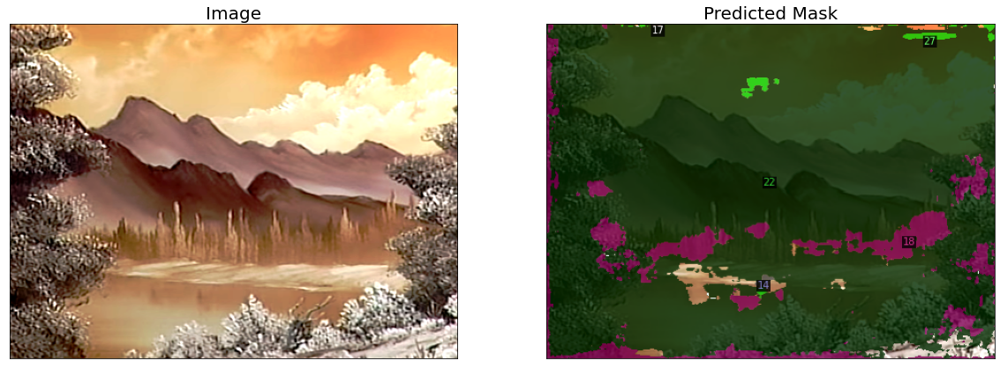

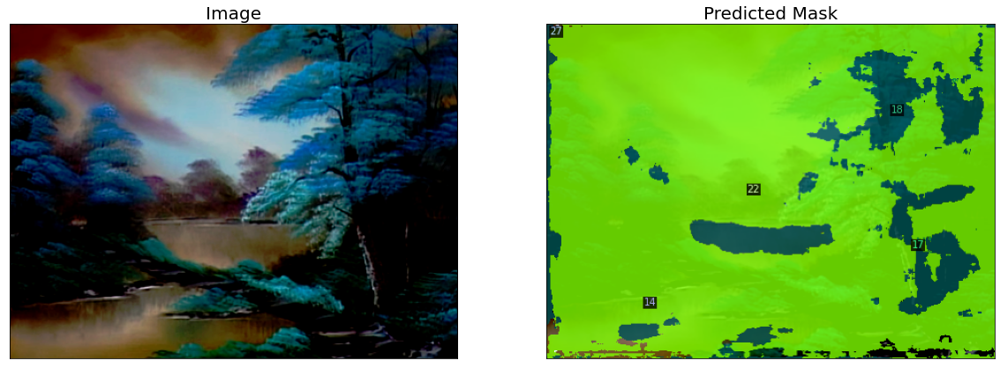

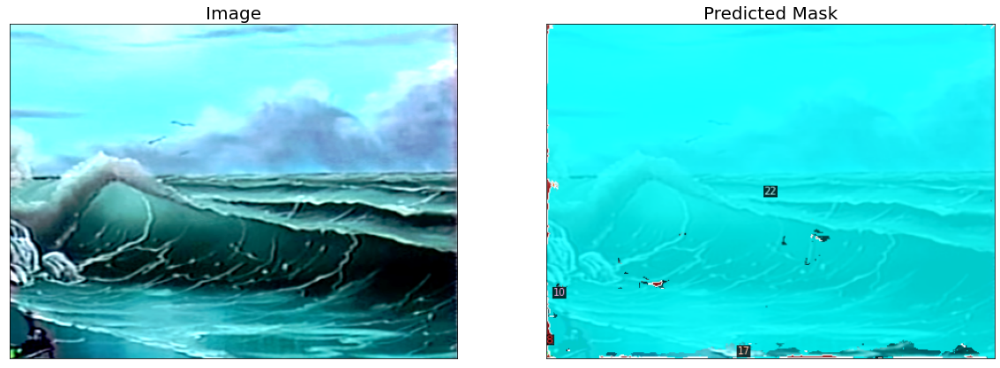

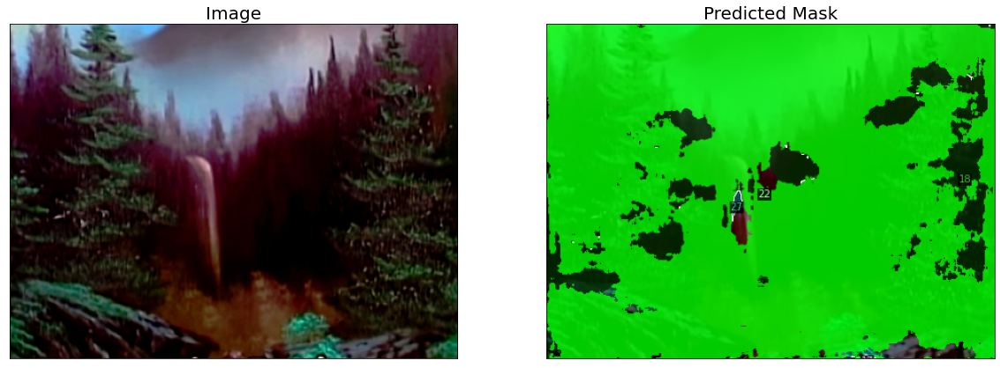

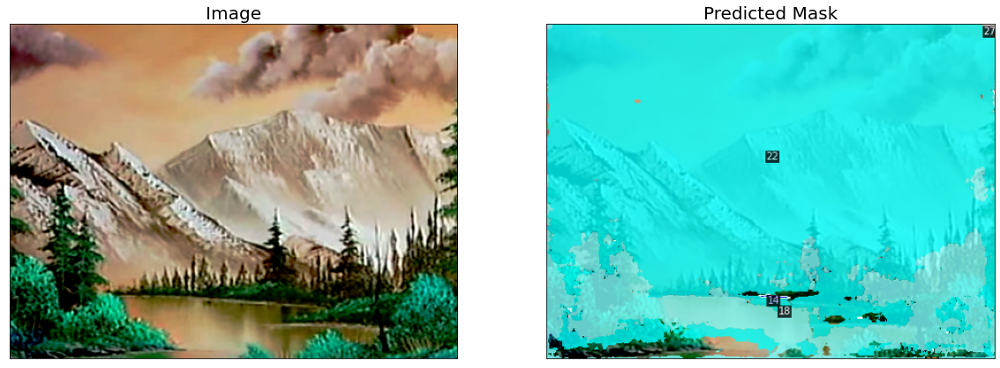

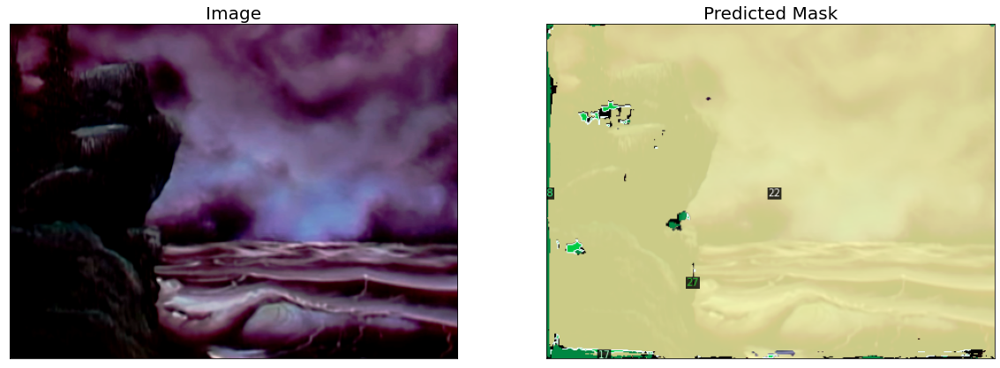

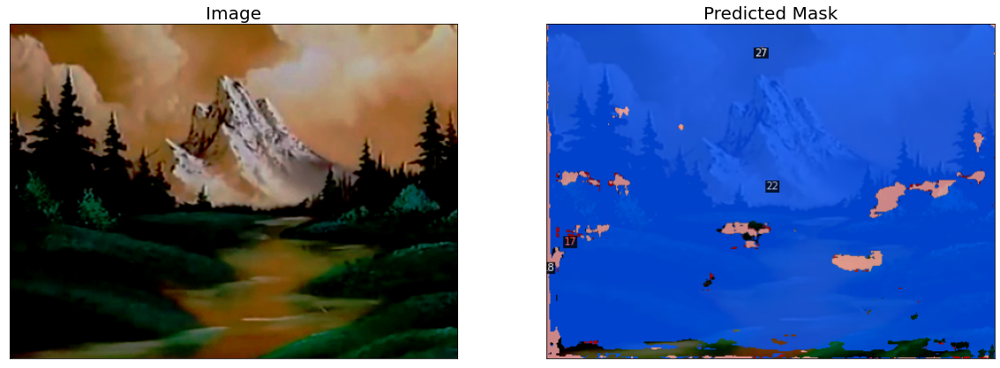

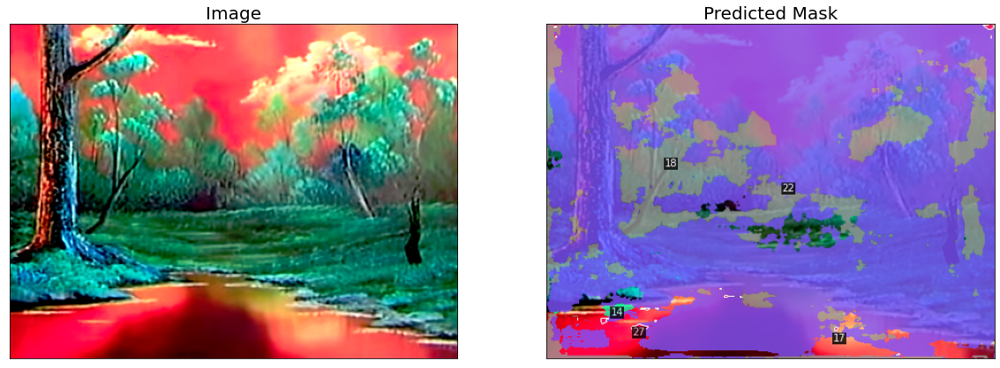

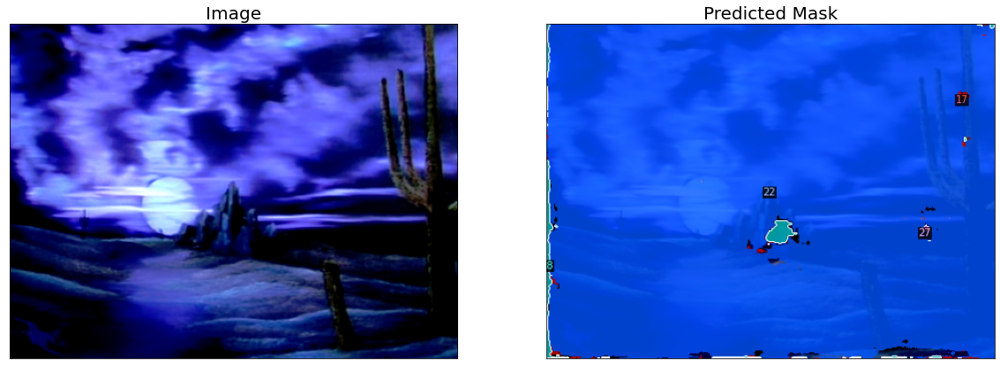

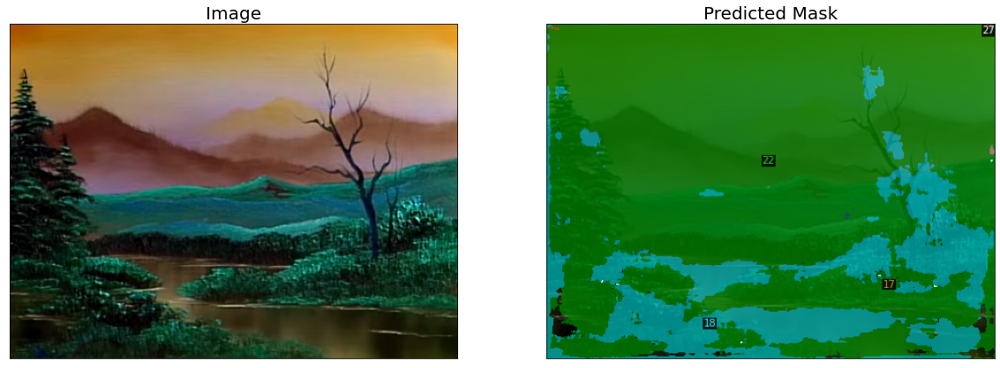

In [54]:
dataset_dicts = load_painting("valid")
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=painting_metadata, scale=1, instance_mode=ColorMode.SEGMENTATION )

    
    outputs = predictor(img)
    outputs = outputs["sem_seg"].argmax(dim=0)
    out_mask = visualizer.draw_sem_seg(outputs.to("cpu"), area_threshold=None, alpha=0.8)
    
    visualize(
        image = img,
        predicted_mask = out_mask.get_image()[:, :, ::-1]
    )